In [1]:
import requests
from datetime import datetime
import time

import json
import pandas as pd
import numpy as np

In [2]:
risk_label = pd.read_csv("risk_label.csv")
risk_label.describe().T 

,count,mean,std,min,25%,50%,75%,max
amount,19787.0,1133.049620,17530.083911,0.000000,0.0,0.0,2.342764,2.000385e+06
risk_score,19787.0,0.164346,1.033468,0.000000,0.0,0.0,0.004791,1.000000e+01
illicit,19787.0,0.097236,0.296286,0.000000,0.0,0.0,0.000000,1.000000e+00
Sanctioned,19787.0,0.193713,0.395217,0.000000,0.0,0.0,0.000000,1.000000e+00
major_per,19787.0,1.593272,10.285099,0.000000,0.0,0.0,0.037309,1.000000e+02
is_primary_entity,7760.0,1.000000,0.000000,1.000000,1.0,1.0,1.000000,1.000000e+00
is_vasp,7760.0,0.534149,0.498865,0.000000,0.0,1.0,1.000000,1.000000e+00
score_change,19787.0,0.000372,0.065880,-4.374542,0.0,0.0,0.000000,3.736362e+00
has_sent,19787.0,0.967352,0.177717,0.000000,1.0,1.0,1.000000,1.000000e+00
has_received,19787.0,0.989690,0.101015,0.000000,1.0,1.0,1.000000,1.000000e+00


In [3]:
risk_label

,tx_hash,tx_time,output_address,fund_type,amount,token,risk_score,illicit,Sanctioned,match_element,major_per,major_ele,is_primary_entity,is_vasp,score_change,has_sent,has_received,illicit_score,Sanctioned_score
0,586602a50212627f7c00200e2a9f578dce0f810836fce4...,2023-05-23T14:58:21Z,TLiyf6mn7ZJp4Xi2GXVuDD5MsGcBRo7bcn,destination_of_funds,0.500119,USDT/tron,0.003828,0,0,+Coin Swap Service,0.038281,ChangeNOW,1.0,1.0,0.000000,1,1,0.000000,0.000000
1,93ec6bab39cdf7db51bb2d954fc81390aca29466131164...,2023-05-23T14:58:21Z,TUGuQNTCQzTTdR7PbJhreHeZGRG8bTm8gj,destination_of_funds,15459.720739,USDT/tron,0.037098,0,1,+OFAC Sanctioned Entity+Terrorist Organisation,0.294134,Garantex Europe OU - OFAC SDN - 5 Apr 2022,1.0,0.0,-0.000007,1,1,0.000000,0.037098
2,c860844213bf6e4dca94cf2b1d8b4e55b10e3761237aee...,2023-05-23T14:58:21Z,TGXj7Sm3H34JZAZVtjUdsV6SbTTPg6D784,destination_of_funds,0.308479,TRX/tron,0.003731,0,0,+Gambling,0.037309,636Hash,1.0,1.0,0.000000,1,1,0.000000,0.000000
3,64abdd3af50681cc394e0555da9f61ed61cb03d48a6e9e...,2023-05-23T14:57:54Z,TGXj7Sm3H34JZAZVtjUdsV6SbTTPg6D784,destination_of_funds,0.308479,TRX/tron,0.003731,0,0,+Gambling,0.037309,636Hash,1.0,1.0,0.000000,1,1,0.000000,0.000000
4,2a8cd6eec8901e05ab9ea413db13f8a8b12c86456e67e9...,2023-05-23T14:57:51Z,TGXj7Sm3H34JZAZVtjUdsV6SbTTPg6D784,destination_of_funds,0.308479,TRX/tron,0.003731,0,0,+Gambling,0.037309,636Hash,1.0,1.0,0.000000,1,1,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19782,44bbd22dcdc199e86bd9ed9ba0bc25f48652866238ff8a...,2023-05-29T12:30:24Z,TRT8WHBKK4t7bVUpXo7AADcBVuGGYfw4hx,destination_of_funds,1.940898,TRX/tron,0.002570,0,1,Exchange,0.025702,Bitpin,1.0,1.0,-0.000131,1,1,0.000000,0.002570
19783,5d7ffaf5a44da7bc8101796798e4d0ef1681c1494e278a...,2023-05-23T14:58:15Z,TGXj7Sm3H34JZAZVtjUdsV6SbTTPg6D784,source_of_funds,0.000000,TRX/tron,0.010196,0,1,OFAC Sanctioned Entity+Coin Swap Service+Gambling,0.085024,ChangeNOW,1.0,1.0,0.000000,1,1,0.000000,0.002480
19784,874b7c2b31a551349206ab08d04e77e425ab1510e80750...,2023-05-23T14:58:18Z,TGXj7Sm3H34JZAZVtjUdsV6SbTTPg6D784,source_of_funds,0.308479,TRX/tron,0.037055,1,0,Phishing+Coin Swap Service,0.370547,FixedFloat,1.0,1.0,0.000000,1,1,0.002296,0.000000
19785,2a919604fbd7cd5d0b823709a531fb49808f395bc85e5e...,2023-05-23T14:55:27Z,TGe7eLBYRJMX6ufH9k8KG2ugJzPtovx3Wy,destination_of_funds,0.000000,USDT/tron,0.002146,0,0,Gambling,0.011061,636Hash,1.0,1.0,-0.000006,1,1,0.000000,0.000000


In [4]:
risk_label = risk_label.sort_values(by='risk_score').reset_index(drop=True)

In [5]:
risk_label

,tx_hash,tx_time,output_address,fund_type,amount,token,risk_score,illicit,Sanctioned,match_element,major_per,major_ele,is_primary_entity,is_vasp,score_change,has_sent,has_received,illicit_score,Sanctioned_score
0,73a8a18bf22a6f5e1f56184995e84da6256f03b7dfd202...,2023-05-25T03:57:06Z,TQPkqmBpy8kuAqc4VB2N6NxiN5PME1w1NF,destination_of_funds,1.033724,TRX/tron,0.0,0,0,NaN,0.0,NaN,NaN,NaN,0.0,1,1,0.0,0.0
1,d9c6a263e0ce2efd58a5aee6ed14dfa5a65ee0f263c95f...,2023-05-29T06:00:33Z,TTomZeJiWSDZfTiLjGHkZJnCWQkjEUwcUE,destination_of_funds,0.000000,TRX/tron,0.0,0,0,NaN,0.0,NaN,NaN,NaN,0.0,1,1,0.0,0.0
2,d4a535dd5b3165d376f6e61954bb3070430c433ae4beb8...,2023-05-29T06:00:27Z,TBA6CypYJizwA9XdC7Ubgc5F1bxrQ7SqPt,destination_of_funds,600.251888,USDT/tron,0.0,0,0,NaN,0.0,NaN,NaN,NaN,0.0,1,1,0.0,0.0
3,e80ae411ecb094a11db8a52bb1abd102ca506b7faa5986...,2023-05-24T06:30:06Z,TD8qoTDBQb9Xke4zAT4PyPAqn7nyZEH1G3,destination_of_funds,0.000000,TRX/tron,0.0,0,0,NaN,0.0,NaN,NaN,NaN,0.0,1,1,0.0,0.0
4,76d4b8408443e25580694dd243312407765667811cafc8...,2023-05-24T06:30:06Z,TKpn4QSQ6Q1fKkF67Ljz2qmnskrLXGi9tP,destination_of_funds,7.790908,TRX/tron,0.0,0,0,NaN,0.0,NaN,NaN,NaN,0.0,1,1,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19782,887bbec2d9fd1d13618617ce2bedba4f536f7efebbff8c...,2023-05-24T00:53:03Z,TWS1onJnNTg8tJHomceqxBxTsUB1DHh7PV,destination_of_funds,1.089782,TRX/tron,10.0,0,0,+Coin Swap Service,100.0,ChangeNOW,1.0,1.0,0.0,1,1,0.0,0.0
19783,ea277d34fecef9553f55232ba3b9dd27a883ad6a3e0162...,2023-05-24T00:53:45Z,TWS1onJnNTg8tJHomceqxBxTsUB1DHh7PV,destination_of_funds,0.000000,TRX/tron,10.0,0,0,+Coin Swap Service,100.0,ChangeNOW,1.0,1.0,0.0,1,1,0.0,0.0
19784,3b71bdd47f5c2def7b28c9ebb4b4be781e5ba423ecf80d...,2023-05-24T00:53:45Z,TWS1onJnNTg8tJHomceqxBxTsUB1DHh7PV,destination_of_funds,0.000000,TRX/tron,10.0,0,0,+Coin Swap Service,100.0,ChangeNOW,1.0,1.0,0.0,1,1,0.0,0.0
19785,33a449f5f80f402fda1e96062281478d51891da37c6910...,2023-05-24T00:52:09Z,TMPJgmLbfLqJA9e9nhgnf2pemWZYyEqmag,destination_of_funds,0.000000,TRX/tron,10.0,0,0,+Coin Swap Service,100.0,FixedFloat,1.0,1.0,0.0,1,1,0.0,0.0


In [6]:
Tronscan_df = pd.read_csv("Tronscan_df.csv")
Tronscan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21080 entries, 0 to 21079
Data columns (total 61 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   hash                     21080 non-null  object 
 1   timestamp                21080 non-null  float64
 2   ownerAddress             21080 non-null  object 
 3   toAddress                21080 non-null  object 
 4   amount                   21080 non-null  float64
 5   fee                      21080 non-null  int64  
 6   net_usage                21080 non-null  int64  
 7   multi_sign_fee           21080 non-null  int64  
 8   net_fee                  21080 non-null  int64  
 9   energy_penalty_total     21080 non-null  int64  
 10  energy_usage             21080 non-null  int64  
 11  energy_fee               21080 non-null  int64  
 12  energy_usage_total       21080 non-null  int64  
 13  memoFee                  21080 non-null  int64  
 14  origin_energy_usage   

In [7]:
Tronscan_df.describe().T 

,count,mean,std,min,25%,50%,75%,max
timestamp,21080.0,1.685032e+12,1.919965e+08,1.684850e+12,1.684899e+12,1.684987e+12,1.685340e+12,1.685363e+12
amount,21080.0,1.906271e+21,1.806104e+23,0.000000e+00,1.000000e+00,5.000000e+00,4.000000e+07,2.575340e+25
fee,21080.0,2.163188e+04,1.464568e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+06
net_usage,21080.0,2.090639e+02,1.299116e+02,0.000000e+00,0.000000e+00,2.650000e+02,2.650000e+02,1.020000e+03
multi_sign_fee,21080.0,1.897533e+02,1.377412e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+06
net_fee,21080.0,8.850133e+04,1.522672e+05,0.000000e+00,0.000000e+00,0.000000e+00,2.670000e+05,1.793000e+06
energy_penalty_total,21080.0,6.840406e+03,1.231038e+04,0.000000e+00,0.000000e+00,0.000000e+00,1.724500e+04,4.392600e+05
energy_usage,21080.0,7.655246e+03,1.910157e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,9.517640e+05
energy_fee,21080.0,2.353768e+06,7.972022e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.469049e+08
energy_usage_total,21080.0,1.333063e+04,2.540115e+04,0.000000e+00,0.000000e+00,0.000000e+00,3.189500e+04,9.517640e+05


In [8]:
df_risk=risk_label[['tx_hash','illicit']]  # select illicit , Sanctioned for modeling
df_risk = df_risk.rename(columns={'tx_hash': 'hash'})
df_risk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19787 entries, 0 to 19786
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   hash     19787 non-null  object
 1   illicit  19787 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 309.3+ KB


In [9]:
dataset=pd.merge(df_risk, Tronscan_df, on='hash', how='inner')
dataset

,hash,illicit,timestamp,ownerAddress,toAddress,amount,fee,net_usage,multi_sign_fee,net_fee,...,SR20,SR21,SR22,SR23,SR24,SR25,SR26,SR27,contractType_1,contractType_31
0,73a8a18bf22a6f5e1f56184995e84da6256f03b7dfd202...,0,1.684987e+12,TWzr8Ftn5Rg5GUadiFWCyuxKVYQGWQpbfU,TQPkqmBpy8kuAqc4VB2N6NxiN5PME1w1NF,13395898.0,0,0,0,268000,...,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1,0
1,d9c6a263e0ce2efd58a5aee6ed14dfa5a65ee0f263c95f...,0,1.685340e+12,TMnYydBHhngrHoU6u4HzRvSyCnbSzzwVD9,TTomZeJiWSDZfTiLjGHkZJnCWQkjEUwcUE,5.0,0,265,0,0,...,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1,0
2,d4a535dd5b3165d376f6e61954bb3070430c433ae4beb8...,0,1.685340e+12,TUebDPkQM8rba5RDGthDBqBmgNUc8zWi24,TBA6CypYJizwA9XdC7Ubgc5F1bxrQ7SqPt,600000000.0,0,338,0,0,...,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0,1
3,e80ae411ecb094a11db8a52bb1abd102ca506b7faa5986...,0,1.684910e+12,THmt8ShsZxuFPf79XGgFmzXM1XhLAfvY2A,TD8qoTDBQb9Xke4zAT4PyPAqn7nyZEH1G3,1.0,0,265,0,0,...,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1,0
4,76d4b8408443e25580694dd243312407765667811cafc8...,0,1.684910e+12,TPkTRriR3vfps8434vyzNvQWNCNGfC5SEB,TKpn4QSQ6Q1fKkF67Ljz2qmnskrLXGi9tP,100000002.0,0,268,0,0,...,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19782,887bbec2d9fd1d13618617ce2bedba4f536f7efebbff8c...,0,1.684890e+12,TTmp9u9mSVFZUftg43BoDnTYssbtCNEsKA,TWS1onJnNTg8tJHomceqxBxTsUB1DHh7PV,13900000.0,0,268,0,0,...,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1,0
19783,ea277d34fecef9553f55232ba3b9dd27a883ad6a3e0162...,0,1.684890e+12,TLmCdT2Wtqsu9AfD2Z8F7bzHYFDwnnNMUX,TWS1onJnNTg8tJHomceqxBxTsUB1DHh7PV,1.0,0,265,0,0,...,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1,0
19784,3b71bdd47f5c2def7b28c9ebb4b4be781e5ba423ecf80d...,0,1.684890e+12,TQ7SjVjrK6JCAa2LD4txzu3tiHro2HvmCU,TWS1onJnNTg8tJHomceqxBxTsUB1DHh7PV,1.0,0,265,0,0,...,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1,0
19785,33a449f5f80f402fda1e96062281478d51891da37c6910...,0,1.684890e+12,TNrY5F7vWXyaZwPBppqu3ooKM3AgrmAHcY,TMPJgmLbfLqJA9e9nhgnf2pemWZYyEqmag,1.0,0,265,0,0,...,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1,0


In [10]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
illicit,19787.0,9.723556e-02,2.962857e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
timestamp,19787.0,1.685030e+12,1.920264e+08,1.684850e+12,1.684899e+12,1.684910e+12,1.685340e+12,1.685363e+12
amount,19787.0,1.260873e+09,1.816396e+10,0.000000e+00,1.000000e+00,5.000000e+00,3.000000e+07,1.999999e+12
fee,19787.0,2.304543e+04,1.510587e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+06
net_usage,19787.0,2.211121e+02,1.228175e+02,0.000000e+00,2.570000e+02,2.650000e+02,2.680000e+02,1.020000e+03
multi_sign_fee,19787.0,2.021529e+02,1.421697e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+06
net_fee,19787.0,7.135048e+04,1.388092e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.793000e+06
energy_penalty_total,19787.0,7.262125e+03,1.256151e+04,0.000000e+00,0.000000e+00,0.000000e+00,1.724500e+04,4.392600e+05
energy_usage,19787.0,7.994690e+03,1.950085e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,9.517640e+05
energy_fee,19787.0,2.478292e+06,8.181961e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.469049e+08


In [11]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19787 entries, 0 to 19786
Data columns (total 62 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   hash                     19787 non-null  object 
 1   illicit                  19787 non-null  int64  
 2   timestamp                19787 non-null  float64
 3   ownerAddress             19787 non-null  object 
 4   toAddress                19787 non-null  object 
 5   amount                   19787 non-null  float64
 6   fee                      19787 non-null  int64  
 7   net_usage                19787 non-null  int64  
 8   multi_sign_fee           19787 non-null  int64  
 9   net_fee                  19787 non-null  int64  
 10  energy_penalty_total     19787 non-null  int64  
 11  energy_usage             19787 non-null  int64  
 12  energy_fee               19787 non-null  int64  
 13  energy_usage_total       19787 non-null  int64  
 14  memoFee               

In [12]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
illicit,19787.0,9.723556e-02,2.962857e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
timestamp,19787.0,1.685030e+12,1.920264e+08,1.684850e+12,1.684899e+12,1.684910e+12,1.685340e+12,1.685363e+12
amount,19787.0,1.260873e+09,1.816396e+10,0.000000e+00,1.000000e+00,5.000000e+00,3.000000e+07,1.999999e+12
fee,19787.0,2.304543e+04,1.510587e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+06
net_usage,19787.0,2.211121e+02,1.228175e+02,0.000000e+00,2.570000e+02,2.650000e+02,2.680000e+02,1.020000e+03
multi_sign_fee,19787.0,2.021529e+02,1.421697e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+06
net_fee,19787.0,7.135048e+04,1.388092e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.793000e+06
energy_penalty_total,19787.0,7.262125e+03,1.256151e+04,0.000000e+00,0.000000e+00,0.000000e+00,1.724500e+04,4.392600e+05
energy_usage,19787.0,7.994690e+03,1.950085e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,9.517640e+05
energy_fee,19787.0,2.478292e+06,8.181961e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.469049e+08


In [13]:
dataset.to_csv('dataset.csv', index=False) 

In [14]:
dataset = pd.read_csv("dataset.csv")
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
illicit,19787.0,9.723556e-02,2.962857e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
timestamp,19787.0,1.685030e+12,1.920264e+08,1.684850e+12,1.684899e+12,1.684910e+12,1.685340e+12,1.685363e+12
amount,19787.0,1.260873e+09,1.816396e+10,0.000000e+00,1.000000e+00,5.000000e+00,3.000000e+07,1.999999e+12
fee,19787.0,2.304543e+04,1.510587e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+06
net_usage,19787.0,2.211121e+02,1.228175e+02,0.000000e+00,2.570000e+02,2.650000e+02,2.680000e+02,1.020000e+03
multi_sign_fee,19787.0,2.021529e+02,1.421697e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+06
net_fee,19787.0,7.135048e+04,1.388092e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.793000e+06
energy_penalty_total,19787.0,7.262125e+03,1.256151e+04,0.000000e+00,0.000000e+00,0.000000e+00,1.724500e+04,4.392600e+05
energy_usage,19787.0,7.994690e+03,1.950085e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,9.517640e+05
energy_fee,19787.0,2.478292e+06,8.181961e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.469049e+08


In [15]:
dataset['hash'].value_counts()

73a8a18bf22a6f5e1f56184995e84da6256f03b7dfd202dd573e67fe13fc6637    1
3eddda2e62cf5ee91195b6f98f5c96671e3b476f2a4bd0be34d3d2a294bf8c4f    1
f689bcb8b39d2b468ae1aa71fedb13d58ec4418a9b0f086b59eaae99eeaf0e42    1
2a919604fbd7cd5d0b823709a531fb49808f395bc85e5e51cc498b3a0a86d651    1
cbe25e524b842965b31ddaf1a9f847325052bc3e588087856991d0fbd11f27cb    1
                                                                   ..
e29ccaa4d4cddff418ae844110eb1afffd81f2d14d3340c9d9ba3403ce8cbfda    1
737ef5652d36af32d65a6a02b55dd2ba2c0d771388616f29f7a7027c8585105f    1
64bbb543fe50d0919bf67a9d33abcae362bc5b4f6724b42e57e80374c8494814    1
c0028e47d30e01e85883f7052eddfcfc582c521ae55b26b531bd470588dce283    1
0064b33732e1bc603bc88eb463e4a4a29e0b01a9f1668edd897c693171143c5f    1
Name: hash, Length: 19787, dtype: int64

In [16]:
dataset['hash'].nunique()

19787

In [17]:
#scaler data before PCA


from sklearn.preprocessing import StandardScaler

num_col=['amount','fee','net_usage','multi_sign_fee','net_fee','energy_penalty_total','energy_usage','energy_fee','energy_usage_total','memoFee','origin_energy_usage','o_balance','o_transactions_in','o_transactions_out','o_totalTransactionCount','o_energyCost','o_netCost','o_freeNetUsed','o_age','t_balance','t_transactions_in','t_transactions_out','t_totalTransactionCount','t_energyCost','t_netCost','t_freeNetUsed','t_age']

scaler=StandardScaler()
scaler_num = scaler.fit_transform(pd.DataFrame(dataset, columns=num_col))

dropped_df =dataset.drop(columns=num_col)

scaler_data=pd.DataFrame(dropped_df)
scaler_data=scaler_data.join(pd.DataFrame(scaler_num, columns=num_col))



In [18]:
scaler_data

,hash,illicit,timestamp,ownerAddress,toAddress,SR0,SR1,SR2,SR3,SR4,...,o_freeNetUsed,o_age,t_balance,t_transactions_in,t_transactions_out,t_totalTransactionCount,t_energyCost,t_netCost,t_freeNetUsed,t_age
0,73a8a18bf22a6f5e1f56184995e84da6256f03b7dfd202...,0,1.684987e+12,TWzr8Ftn5Rg5GUadiFWCyuxKVYQGWQpbfU,TQPkqmBpy8kuAqc4VB2N6NxiN5PME1w1NF,1.0,0.0,1.0,1.0,0.0,...,0.578220,1.319369,-0.072765,-0.150515,-0.148539,-0.050933,-1.282849,-0.002230,-0.324618,-0.224371
1,d9c6a263e0ce2efd58a5aee6ed14dfa5a65ee0f263c95f...,0,1.685340e+12,TMnYydBHhngrHoU6u4HzRvSyCnbSzzwVD9,TTomZeJiWSDZfTiLjGHkZJnCWQkjEUwcUE,1.0,1.0,1.0,1.0,0.0,...,0.598333,0.299746,-0.072764,-0.150416,-0.148527,-0.050928,0.643556,1.634130,-1.205485,-0.039991
2,d4a535dd5b3165d376f6e61954bb3070430c433ae4beb8...,0,1.685340e+12,TUebDPkQM8rba5RDGthDBqBmgNUc8zWi24,TBA6CypYJizwA9XdC7Ubgc5F1bxrQ7SqPt,1.0,0.0,1.0,1.0,0.0,...,-1.551504,0.769810,3.941808,7.187937,6.316586,1.021729,0.643556,1.634130,-1.205485,0.324191
3,e80ae411ecb094a11db8a52bb1abd102ca506b7faa5986...,0,1.684910e+12,THmt8ShsZxuFPf79XGgFmzXM1XhLAfvY2A,TD8qoTDBQb9Xke4zAT4PyPAqn7nyZEH1G3,0.0,1.0,1.0,1.0,1.0,...,0.526821,1.723761,-0.072763,-0.150191,-0.148407,-0.050911,0.647084,-0.800524,0.281340,-0.153550
4,76d4b8408443e25580694dd243312407765667811cafc8...,0,1.684910e+12,TPkTRriR3vfps8434vyzNvQWNCNGfC5SEB,TKpn4QSQ6Q1fKkF67Ljz2qmnskrLXGi9tP,0.0,1.0,1.0,1.0,1.0,...,-0.284396,-1.030947,0.971012,0.988624,0.756194,0.062338,0.647086,-0.800526,-1.205485,-0.078759
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19782,887bbec2d9fd1d13618617ce2bedba4f536f7efebbff8c...,0,1.684890e+12,TTmp9u9mSVFZUftg43BoDnTYssbtCNEsKA,TWS1onJnNTg8tJHomceqxBxTsUB1DHh7PV,1.0,0.0,1.0,1.0,0.0,...,-1.692294,-1.030947,-0.048870,1.569409,0.711496,0.066107,0.294920,-0.817968,-1.205485,-0.064107
19783,ea277d34fecef9553f55232ba3b9dd27a883ad6a3e0162...,0,1.684890e+12,TLmCdT2Wtqsu9AfD2Z8F7bzHYFDwnnNMUX,TWS1onJnNTg8tJHomceqxBxTsUB1DHh7PV,1.0,1.0,0.0,0.0,1.0,...,0.555873,-0.194511,-0.048870,1.569409,0.711496,0.066107,0.294920,-0.817968,-1.205485,-0.064107
19784,3b71bdd47f5c2def7b28c9ebb4b4be781e5ba423ecf80d...,0,1.684890e+12,TQ7SjVjrK6JCAa2LD4txzu3tiHro2HvmCU,TWS1onJnNTg8tJHomceqxBxTsUB1DHh7PV,1.0,1.0,0.0,0.0,1.0,...,0.555873,1.270980,-0.048870,1.569409,0.711496,0.066107,0.294920,-0.817968,-1.205485,-0.064107
19785,33a449f5f80f402fda1e96062281478d51891da37c6910...,0,1.684890e+12,TNrY5F7vWXyaZwPBppqu3ooKM3AgrmAHcY,TMPJgmLbfLqJA9e9nhgnf2pemWZYyEqmag,1.0,1.0,0.0,0.0,1.0,...,-0.590558,-0.426087,-0.072765,-0.150517,-0.148539,-0.050933,0.266795,-0.817986,0.784692,-0.224676


In [19]:
scaler_data.describe().T

,count,mean,std,min,25%,50%,75%,max
illicit,19787.0,9.723556e-02,2.962857e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
timestamp,19787.0,1.685030e+12,1.920264e+08,1.684850e+12,1.684899e+12,1.684910e+12,1.685340e+12,1.685363e+12
SR0,19787.0,7.295194e-01,4.442193e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
SR1,19787.0,7.243645e-01,4.468452e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
SR2,19787.0,7.058170e-01,4.556862e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
SR3,19787.0,7.112751e-01,4.531812e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
SR4,19787.0,5.128620e-01,4.998472e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
SR5,19787.0,7.300248e-01,4.439578e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
SR6,19787.0,6.991964e-01,4.586190e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
SR7,19787.0,7.037954e-01,4.565939e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


<AxesSubplot:>

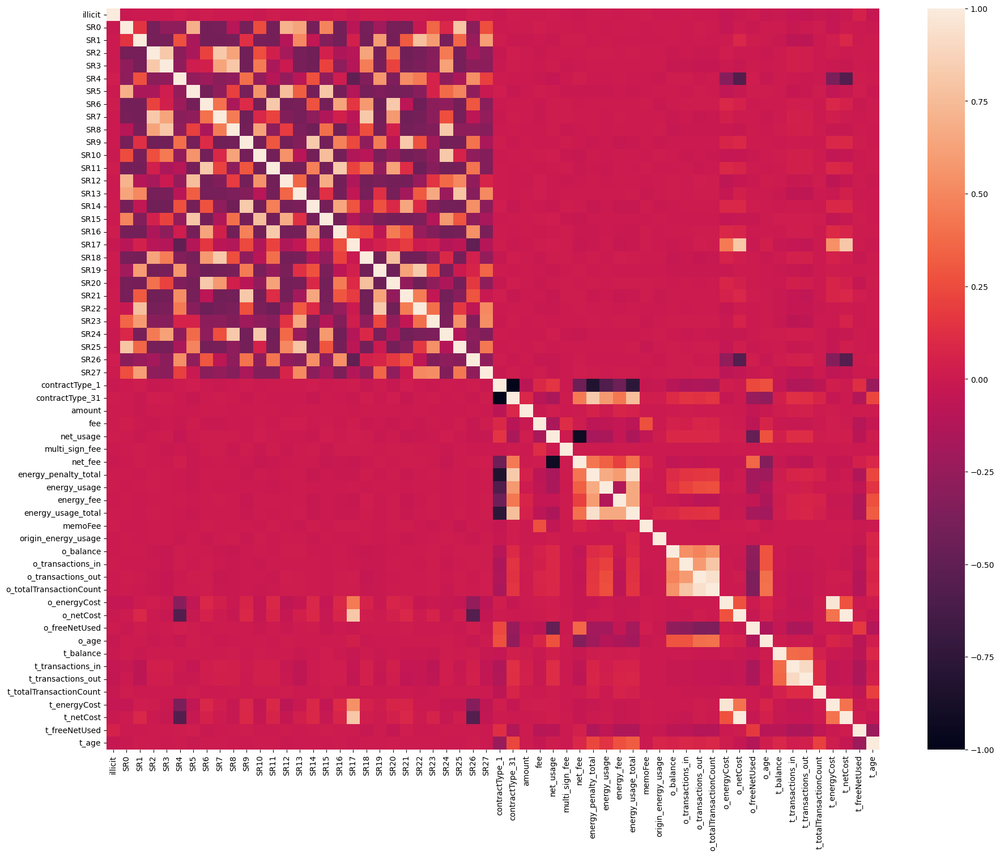

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

scaler_data=pd.DataFrame(scaler_data.drop(columns=['hash', 'timestamp','ownerAddress', 'toAddress']))
plt.figure(figsize=(22, 17))
sns.heatmap(scaler_data.corr())


In [21]:
scaler_data.corr()

,illicit,SR0,SR1,SR2,SR3,SR4,SR5,SR6,SR7,SR8,...,o_freeNetUsed,o_age,t_balance,t_transactions_in,t_transactions_out,t_totalTransactionCount,t_energyCost,t_netCost,t_freeNetUsed,t_age
illicit,1.000000,-0.011749,-0.005603,-0.002992,-0.000938,0.022951,-0.002523,0.008088,-0.002653,-0.003670,...,0.006987,-0.022430,-0.014559,-0.038420,-0.044955,-0.016003,-0.035316,-0.011732,0.050412,-0.030524
SR0,-0.011749,1.000000,0.147117,-0.393109,-0.274470,-0.283650,0.687860,-0.399385,-0.395023,-0.094702,...,-0.015430,0.002654,0.006908,-0.017046,-0.006694,0.011042,-0.035602,0.004724,-0.004397,-0.011538
SR1,-0.005603,0.147117,1.000000,-0.398246,-0.393018,0.269308,-0.163674,-0.404605,-0.400186,-0.389925,...,0.011327,0.002328,-0.011188,-0.069774,-0.066325,-0.007460,0.017706,0.083788,-0.003762,0.005483
SR2,-0.002992,-0.393109,-0.398246,1.000000,0.818246,-0.297917,-0.150026,0.217176,0.819044,0.627947,...,-0.000626,-0.012588,0.002726,0.035153,0.031021,-0.004723,0.009160,-0.007052,0.000984,0.002389
SR3,-0.000938,-0.274470,-0.393018,0.818246,1.000000,-0.278678,0.021260,0.032466,0.636715,0.809161,...,0.000968,-0.006866,0.006559,0.032570,0.030463,-0.002098,-0.011131,-0.021395,0.002208,-0.001561
SR4,0.022951,-0.283650,0.269308,-0.297917,-0.278678,1.000000,-0.262437,-0.226302,-0.310276,-0.273533,...,0.017893,-0.017516,0.002523,-0.005195,-0.008325,-0.003298,-0.379594,-0.563571,0.013817,0.007481
SR5,-0.002523,0.687860,-0.163674,-0.150026,0.021260,-0.262437,1.000000,-0.398873,-0.274341,0.202123,...,0.009773,0.007962,0.006310,-0.024574,-0.015268,0.013627,-0.048779,-0.016887,0.016607,-0.008406
SR6,0.008088,-0.399385,-0.404605,0.217176,0.032466,-0.226302,-0.398873,1.000000,0.398478,-0.149139,...,-0.005952,0.005020,0.001997,0.026372,0.023303,-0.001897,0.081766,0.054571,-0.013237,0.002047
SR7,-0.002653,-0.395023,-0.400186,0.819044,0.636715,-0.310276,-0.274341,0.398478,1.000000,0.446220,...,0.004116,-0.009467,0.004627,0.042489,0.038898,-0.003762,0.025667,0.002201,-0.002700,0.002589
SR8,-0.003670,-0.094702,-0.389925,0.627947,0.809161,-0.273533,0.202123,-0.149139,0.446220,1.000000,...,0.000653,-0.001024,0.013796,0.038170,0.037360,0.004555,-0.020948,-0.023025,0.003953,-0.001180


In [22]:
illicit_corr=scaler_data.corrwith(scaler_data['illicit']).abs().sort_values(ascending=0)
illicit_corr.head()

illicit               1.000000
t_freeNetUsed         0.050412
t_transactions_out    0.044955
t_transactions_in     0.038420
o_energyCost          0.037932
dtype: float64

<AxesSubplot:>

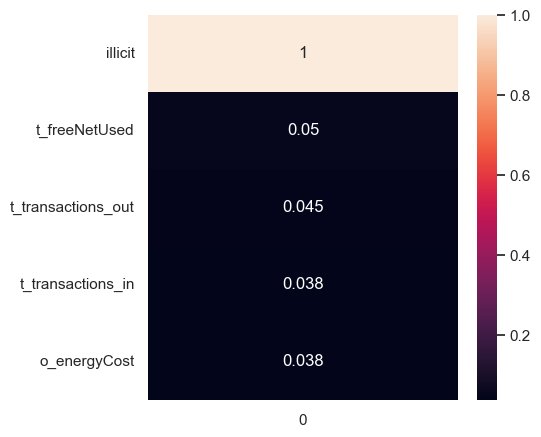

In [23]:
sns.set(rc={'figure.figsize':(5,5)})
sns.heatmap(pd.DataFrame(illicit_corr).head(), annot=True)

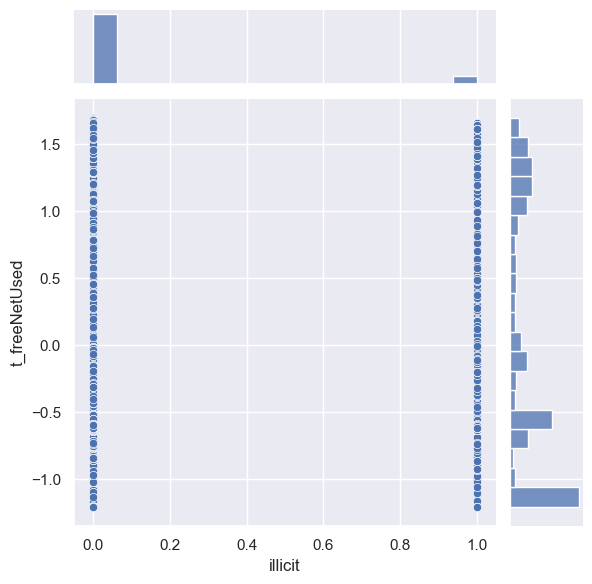

In [24]:
import seaborn as sns
sns.jointplot(x=scaler_data['illicit'],y=scaler_data['t_freeNetUsed']);

C:\Users\user1234\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\user1234\AppData\Local\Temp\ipykernel_19220\850187916.py:19: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


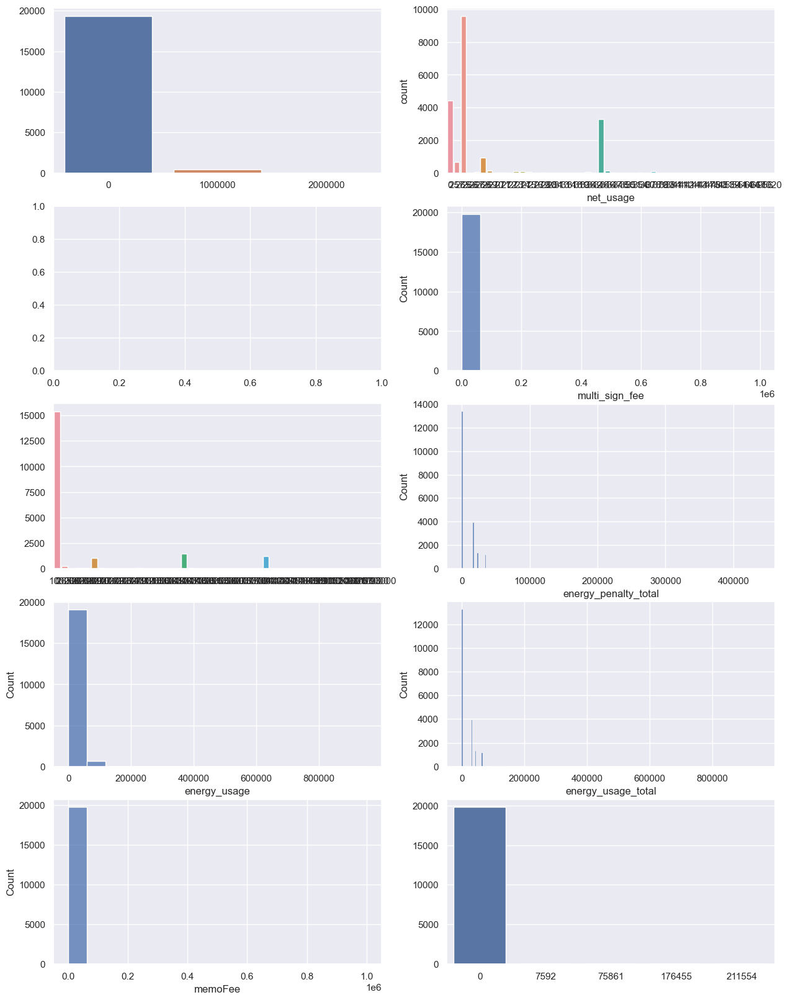

In [25]:
fig, ax =plt.subplots(5,2,figsize=(15,20))

sns.barplot(y=dataset['fee'].value_counts().values, x=dataset['fee'].value_counts().index, ax=ax[0,0] )
sns.countplot(dataset['net_usage'], ax=ax[0,1] )

#sns.barplot(y=dataset['origin_energy_usage'].value_counts().values, x=dataset['origin_energy_usage'].value_counts().index, ax=ax[1,0] )
#sns.barplot(y=df['net_usage'].value_counts().values, x=df['net_usage'].value_counts().index, ax=ax[1,1] )
sns.histplot(dataset['multi_sign_fee'], ax=ax[1,1] )

sns.barplot(y=dataset['net_fee'].value_counts().values, x=dataset['net_fee'].value_counts().index, ax=ax[2,0] )
sns.histplot(dataset['energy_penalty_total'], ax=ax[2,1] )

sns.histplot(dataset['energy_usage'], ax=ax[3,0])
sns.histplot(dataset['energy_usage_total'], ax=ax[3,1])

sns.histplot(dataset['memoFee'], ax=ax[4,0])
sns.barplot(y=dataset['origin_energy_usage'].value_counts().values, x=dataset['origin_energy_usage'].value_counts().index, ax=ax[4,1] )

fig.show()

Text(0.5, 1.0, 'o_age')

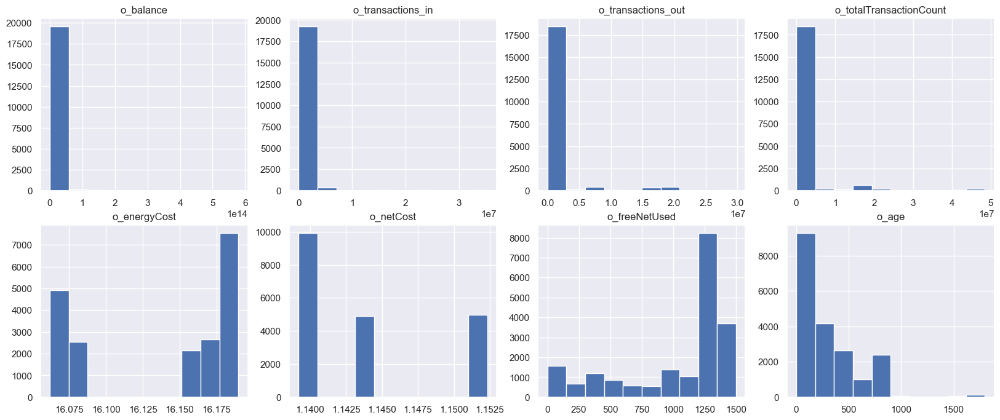

In [26]:
plt.figure(figsize=(20,8))

plt.subplot(2,4,1)
plt.hist(dataset['o_balance'])
plt.title('o_balance')

plt.subplot(2,4,2)
plt.hist(dataset['o_transactions_in'])
plt.title('o_transactions_in')

plt.subplot(2,4,3)
plt.hist(dataset['o_transactions_out'])
plt.title('o_transactions_out')

plt.subplot(2,4,4)
plt.hist(dataset['o_totalTransactionCount'])
plt.title('o_totalTransactionCount')

plt.subplot(2,4,5)
plt.hist(dataset['o_energyCost'])
plt.title('o_energyCost')

plt.subplot(2,4,6)
plt.hist(dataset['o_netCost'])
plt.title('o_netCost')

plt.subplot(2,4,7)
plt.hist(dataset['o_freeNetUsed'])
plt.title('o_freeNetUsed')

plt.subplot(2,4,8)
plt.hist(dataset['o_age'])
plt.title('o_age')

Text(0.5, 1.0, 't_age')

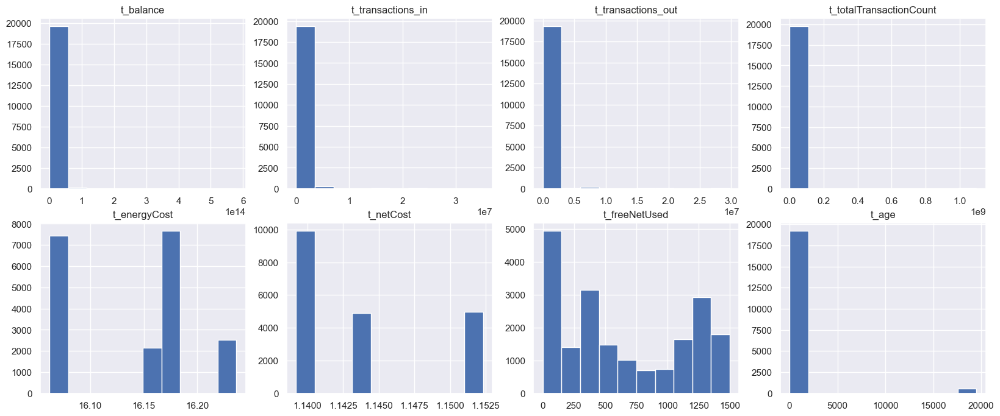

In [27]:
plt.figure(figsize=(20,8))

plt.subplot(2,4,1)
plt.hist(dataset['t_balance'])
plt.title('t_balance')

plt.subplot(2,4,2)
plt.hist(dataset['t_transactions_in'])
plt.title('t_transactions_in')

plt.subplot(2,4,3)
plt.hist(dataset['t_transactions_out'])
plt.title('t_transactions_out')

plt.subplot(2,4,4)
plt.hist(dataset['t_totalTransactionCount'])
plt.title('t_totalTransactionCount')

plt.subplot(2,4,5)
plt.hist(dataset['t_energyCost'])
plt.title('t_energyCost')

plt.subplot(2,4,6)
plt.hist(dataset['t_netCost'])
plt.title('t_netCost')

plt.subplot(2,4,7)
plt.hist(dataset['t_freeNetUsed'])
plt.title('t_freeNetUsed')

plt.subplot(2,4,8)
plt.hist(dataset['t_age'])
plt.title('t_age')

In [30]:
# reduce dimonsion to 2 by PCA

from sklearn.decomposition import PCA

pca2d = PCA(n_components = 2)
pca2d.fit(scaler_data)
data_pca2d = pca2d.transform(scaler_data)
data_pca2d = pd.DataFrame(data_pca2d,columns=['PC1','PC2'])
data_pca2d

,PC1,PC2
0,-0.717792,0.755875
1,-1.201304,-0.969262
2,2.213837,-0.478049
3,-1.225746,-0.921844
4,-0.795228,-0.179880
...,...,...
19782,-0.470969,-0.465631
19783,-0.906939,-0.216365
19784,-0.858275,-0.718037
19785,-1.107149,-0.357865


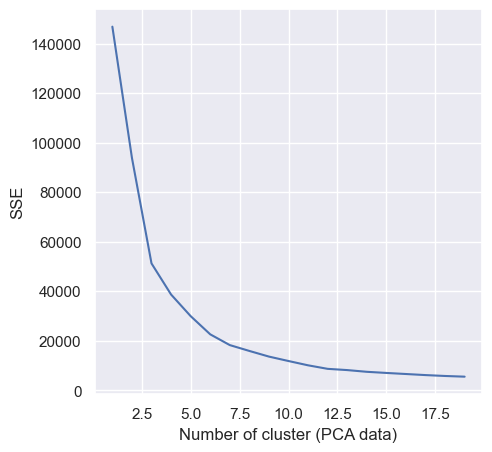

In [31]:
#clustor PCA data

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


if 'clusters' in data_pca2d:
    data_pca2d=data_pca2d.drop(['clusters'], axis=1)

sse = {}
for k in range(1, 20):
    kmeans = KMeans( n_clusters=k, max_iter=1000).fit(data_pca2d)
    data_pca2d["clusters"] = kmeans.labels_
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster (PCA data)")
plt.ylabel("SSE")
plt.show()

In [32]:
if 'clusters' in data_pca2d:
    data_pca2d=data_pca2d.drop(['clusters'], axis=1)
if 'illicit' in data_pca2d:
    data_pca2d=data_pca2d.drop(['illicit'], axis=1)

kmeans = KMeans(n_clusters=11, max_iter=1000).fit(data_pca2d)
data_pca2d["clusters"] = kmeans.labels_
data_pca2d

,PC1,PC2,clusters
0,-0.717792,0.755875,10
1,-1.201304,-0.969262,0
2,2.213837,-0.478049,8
3,-1.225746,-0.921844,0
4,-0.795228,-0.179880,3
...,...,...,...
19782,-0.470969,-0.465631,3
19783,-0.906939,-0.216365,3
19784,-0.858275,-0.718037,0
19785,-1.107149,-0.357865,3


<AxesSubplot:>

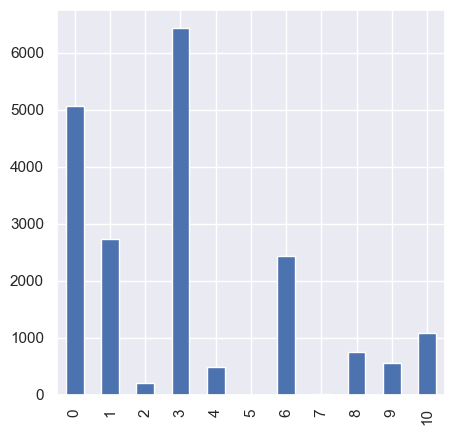

In [33]:
data_pca2d["clusters"].value_counts().sort_index().plot.bar()

In [34]:
# color map
data_pca2d['clusters'].replace([0,1,2,3,4,5,6,7,8,9,10,11],
                        ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9','C10','C11'], inplace=True)

In [35]:
# plot dataset clustor in 2D from different view

import plotly.express as px
#df = px.data.iris()
fig = px.scatter(data_pca2d, x='PC1', y='PC2',
              color='clusters')

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

In [36]:
data_pca2d=data_pca2d.join(risk_label['illicit'])
data_pca2d['illicit'].replace([0,1],["licit","illicit"], inplace=True)
data_pca2d

,PC1,PC2,clusters,illicit
0,-0.717792,0.755875,C10,licit
1,-1.201304,-0.969262,C0,licit
2,2.213837,-0.478049,C8,licit
3,-1.225746,-0.921844,C0,licit
4,-0.795228,-0.179880,C3,licit
...,...,...,...,...
19782,-0.470969,-0.465631,C3,licit
19783,-0.906939,-0.216365,C3,licit
19784,-0.858275,-0.718037,C0,licit
19785,-1.107149,-0.357865,C3,licit


In [37]:
# plot dataset clustor in 2D from different view

import plotly.express as px
#df = px.data.iris()
fig = px.scatter(data_pca2d, x='PC1', y='PC2',
              color='illicit')

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

In [38]:
import plotly.express as px

fig = px.scatter(data_pca2d, x='PC1', y='PC2', height=300, width=1000,color='illicit', facet_col='clusters')
fig.show()

In [39]:
# reduce dimonsion to 3 by PCA

from sklearn.decomposition import PCA

#data_pca=dataset.drop(['illicit','timestamp','ownerAddress','toAddress','hash'], axis=1)

pca = PCA(n_components = 3)
pca.fit(scaler_data)
data_pca = pca.transform(scaler_data)
data_pca = pd.DataFrame(data_pca,columns=['PC1','PC2','PC3'])
data_pca

,PC1,PC2,PC3
0,-0.717787,0.755861,-1.061669
1,-1.201303,-0.969260,2.109468
2,2.213833,-0.478046,1.065609
3,-1.225741,-0.921841,-0.430322
4,-0.795225,-0.179873,-0.599970
...,...,...,...
19782,-0.470966,-0.465624,-0.926121
19783,-0.906932,-0.216370,-0.948081
19784,-0.858267,-0.718040,-1.000489
19785,-1.107147,-0.357861,-0.963335


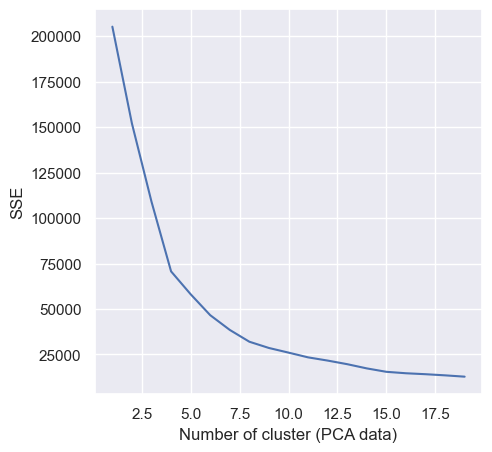

In [40]:
#clustor PCA data

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


if 'clusters' in data_pca:
    data_pca=data_pca.drop(['clusters'], axis=1)

sse = {}
for k in range(1, 20):
    kmeans = KMeans( n_clusters=k, max_iter=1000).fit(data_pca)
    data_pca["clusters"] = kmeans.labels_
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster (PCA data)")
plt.ylabel("SSE")
plt.show()

In [41]:
if 'clusters' in data_pca:
    data_pca=data_pca.drop(['clusters'], axis=1)

kmeans = KMeans(n_clusters=11, max_iter=1000).fit(data_pca)
data_pca["clusters"] = kmeans.labels_
data_pca

,PC1,PC2,PC3,clusters
0,-0.717787,0.755861,-1.061669,6
1,-1.201303,-0.969260,2.109468,2
2,2.213833,-0.478046,1.065609,10
3,-1.225741,-0.921841,-0.430322,8
4,-0.795225,-0.179873,-0.599970,8
...,...,...,...,...
19782,-0.470966,-0.465624,-0.926121,8
19783,-0.906932,-0.216370,-0.948081,8
19784,-0.858267,-0.718040,-1.000489,8
19785,-1.107147,-0.357861,-0.963335,8


<AxesSubplot:>

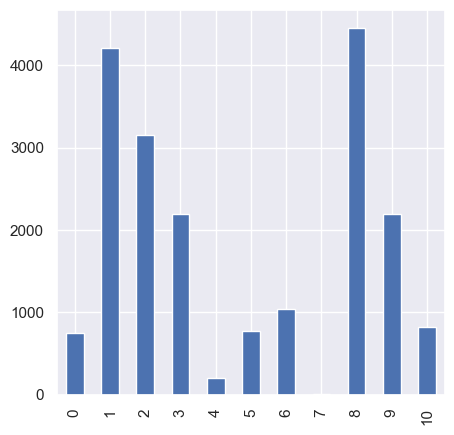

In [42]:
data_pca["clusters"].value_counts().sort_index().plot.bar()

In [43]:
# color map
data_pca['clusters'].replace([0,1,2,3,4,5,6,7,8,9,10,11],
                        ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9','C10','C11'], inplace=True)

In [44]:
# plot dataset clustor in 2D from different view

import plotly.express as px
#df = px.data.iris()
fig = px.scatter_3d(data_pca, x='PC1', y='PC2',z='PC3',
              color='clusters')

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

In [45]:
data_pca=data_pca.join(risk_label['illicit'])
data_pca['illicit'].replace([0,1],["licit","illicit"], inplace=True)
data_pca

,PC1,PC2,PC3,clusters,illicit
0,-0.717787,0.755861,-1.061669,C6,licit
1,-1.201303,-0.969260,2.109468,C2,licit
2,2.213833,-0.478046,1.065609,C10,licit
3,-1.225741,-0.921841,-0.430322,C8,licit
4,-0.795225,-0.179873,-0.599970,C8,licit
...,...,...,...,...,...
19782,-0.470966,-0.465624,-0.926121,C8,licit
19783,-0.906932,-0.216370,-0.948081,C8,licit
19784,-0.858267,-0.718040,-1.000489,C8,licit
19785,-1.107147,-0.357861,-0.963335,C8,licit


In [46]:
# plot dataset clustor in 3D from different view

import plotly.express as px
#df = px.data.iris()
fig = px.scatter_3d(data_pca, x='PC1', y='PC2', z='PC3',
              color='illicit')

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()